# FGVC Aircraft Identification

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

We import all the necessary packages. We are going to work with the [fastai V1 library](http://www.fast.ai/2018/10/02/fastai-ai/) which sits on top of [Pytorch 1.0](https://hackernoon.com/pytorch-1-0-468332ba5163). The fastai library provides many useful functions that enable us to quickly and easily build neural networks and train our models.

In [2]:
from fastai import *
from fastai.vision import *

In [5]:
!wget /home/jupyter/.fastai/data/ http://www.robots.ox.ac.uk/~vgg/data/fgvc-aircraft/archives/fgvc-aircraft-2013b.tar.gz

/home/jupyter/.fastai/data/: Scheme missing.
--2018-11-16 13:42:59--  http://www.robots.ox.ac.uk/~vgg/data/fgvc-aircraft/archives/fgvc-aircraft-2013b.tar.gz
Resolving www.robots.ox.ac.uk (www.robots.ox.ac.uk)... 129.67.94.2
Connecting to www.robots.ox.ac.uk (www.robots.ox.ac.uk)|129.67.94.2|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2753340328 (2.6G) [application/x-gzip]
Saving to: ‘fgvc-aircraft-2013b.tar.gz’

fgvc-aircraft-2013b 100%[===================>]   2.56G  22.1MB/s    in 2m 13s  

2018-11-16 13:45:13 (19.8 MB/s) - ‘fgvc-aircraft-2013b.tar.gz’ saved [2753340328/2753340328]

FINISHED --2018-11-16 13:45:13--
Total wall clock time: 2m 13s
Downloaded: 1 files, 2.6G in 2m 13s (19.8 MB/s)


If you're using a computer with an unusually small GPU, you may get an out of memory error when running this notebook. If this happens, click Kernel->Restart, uncomment the 2nd line below to use a smaller *batch size* (you'll learn all about what this means during the course), and try again.

In [13]:
bs = 64
# bs = 16   # uncomment this line if you run out of memory even after clicking Kernel->Restart

## Looking at the data

We are going to use the [FGVC-Aircraft Benchmark Dataset](http://www.robots.ox.ac.uk/~vgg/data/fgvc-aircraft/) by [O. M. Parkhi et al., 2012](https://arxiv.org/pdf/1306.5151.pdf) which features 12 cat breeds and 25 dogs breeds. Our model will need to learn to differentiate between these 37 distinct categories. According to their paper, the best accuracy they could get in 2012 was 59.21%, using a complex model that was specific to pet detection, with separate "Image", "Head", and "Body" models for the pet photos. Let's see how accurate we can be using deep learning!

We are going to use the `untar_data` function to which we must pass a URL as an argument and which will download and extract the data.

In [19]:
help(untar_data)

Help on function untar_data in module fastai.datasets:

untar_data(url:str, fname:Union[pathlib.Path, str]=None, dest:Union[pathlib.Path, str]=None, data=True)
    Download `url` if it doesn't exist to `fname` and un-tgz to folder `dest`



In [8]:
!ls

Aircraft.ipynb	fgvc-aircraft-2013b.tar.gz  Fgvc_Aircraft.ipynb


Extracting using tarfile

In [9]:
import tarfile
fname = './fgvc-aircraft-2013b.tar.gz'

if (fname.endswith("tar.gz")):
    tar = tarfile.open(fname, "r:gz")
    tar.extractall()
    tar.close()

In [12]:
!ls ./fgvc-aircraft-2013b/data/

families.txt			  images_manufacturer_val.txt
images				  images_test.txt
images_box.txt			  images_train.txt
images_family_test.txt		  images_val.txt
images_family_train.txt		  images_variant_test.txt
images_family_trainval.txt	  images_variant_train.txt
images_family_val.txt		  images_variant_trainval.txt
images_manufacturer_test.txt	  images_variant_val.txt
images_manufacturer_train.txt	  manufacturers.txt
images_manufacturer_trainval.txt  variants.txt


In [133]:
path = Path('./fgvc-aircraft-2013b');path

PosixPath('fgvc-aircraft-2013b')

In [134]:
path.ls()

[PosixPath('fgvc-aircraft-2013b/README.md'),
 PosixPath('fgvc-aircraft-2013b/vl_pr.m'),
 PosixPath('fgvc-aircraft-2013b/vl_roc.m'),
 PosixPath('fgvc-aircraft-2013b/vl_argparse.m'),
 PosixPath('fgvc-aircraft-2013b/example_evaluation.m'),
 PosixPath('fgvc-aircraft-2013b/evaluation.m'),
 PosixPath('fgvc-aircraft-2013b/README.html'),
 PosixPath('fgvc-aircraft-2013b/data'),
 PosixPath('fgvc-aircraft-2013b/vl_tpfp.m')]

In [135]:
path_anno = path/'annotations'
path_img = path/'data/images'

In [136]:
path_img

PosixPath('fgvc-aircraft-2013b/data/images')

Total number of images

In [137]:
len(path_img.ls())

10001

The first thing we do when we approach a problem is to take a look at the data. We _always_ need to understand very well what the problem is and what the data looks like before we can figure out how to solve it. Taking a look at the data means understanding how the data directories are structured, what the labels are and what some sample images look like.

The main difference between the handling of image classification datasets is the way labels are stored. In this particular dataset, labels are stored in the filenames themselves. We will need to extract them to be able to classify the images into the correct categories. Fortunately, the fastai library has a handy function made exactly for this, `ImageDataBunch.from_name_re` gets the labels from the filenames using a [regular expression](https://docs.python.org/3.6/library/re.html).

In [138]:
trainval =  open("./fgvc-aircraft-2013b/data/images_manufacturer_trainval.txt").read()
lst = trainval.split("\n")

In [140]:
f_names = [];labels = []
len(lst)

6667

In [142]:
lst[-1]

'1594714 Yakovlev'

In [143]:
for img in lst:
    f_names.append(Path(str(path_img)+'/'+img[:7]+'.jpg'))
    labels.append(img[8:])

In [125]:
f_names[-1]

PosixPath('fgvc-aircraft-2013b/data/images/.jpg')

In [144]:
len(labels)

6667

In [60]:
# fnames = get_image_files(path_img)
# fnames[:5]

[]

/opt/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


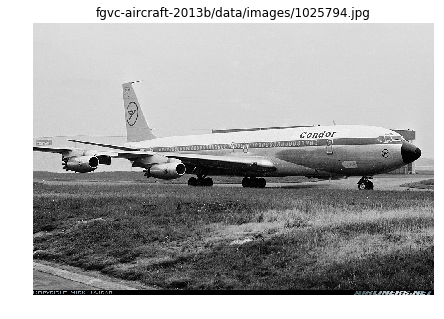

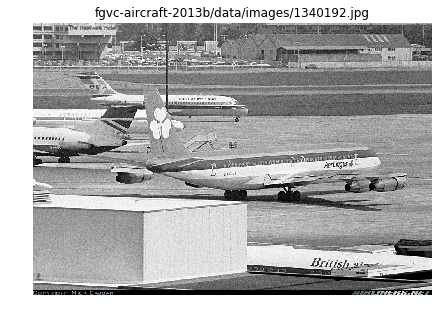

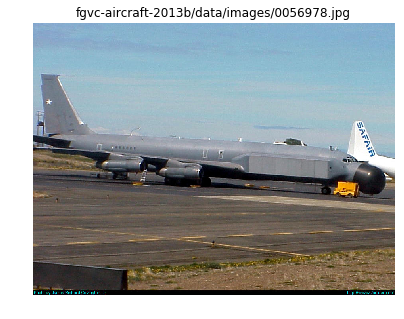

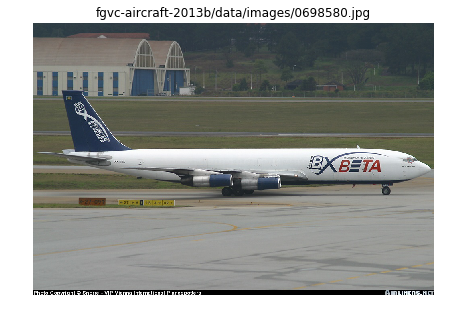

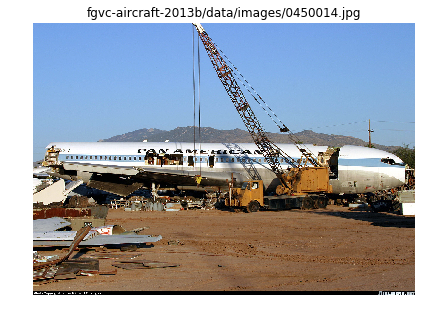

...

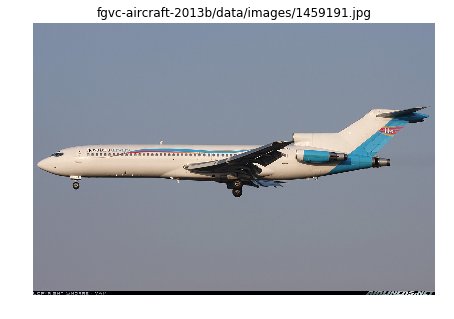

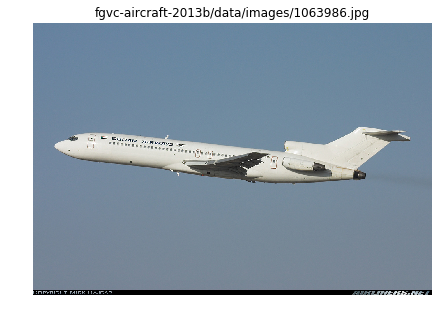

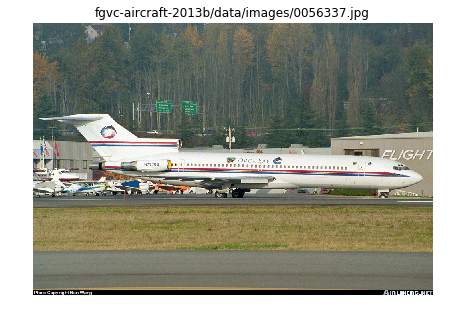

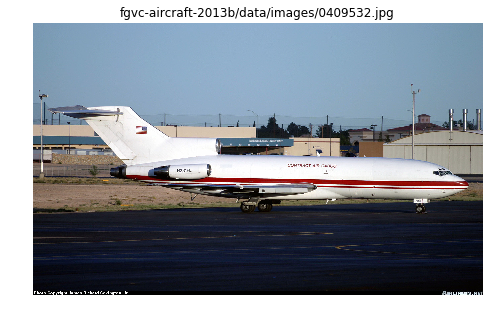

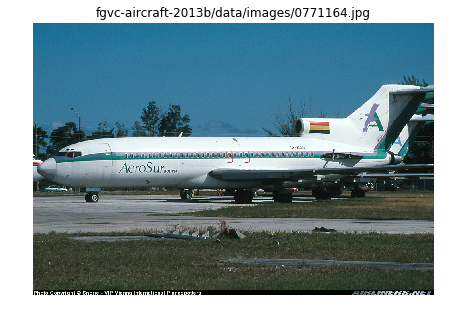

In [145]:
for im in f_names[:50]:
  img = open_image(im)
  img.show(figsize=(10, 5), title=im)

In [18]:
# np.random.seed(2)
# pat = r'/([^/]+)_\d+.jpg$'

In [0]:
# data = ImageDataBunch.from_name_re(path_img, fnames, pat, ds_tfms=get_transforms(), size=224, bs=bs
#                                   ).normalize(imagenet_stats)

In [146]:
data = ImageDataBunch.from_lists(path_img, f_names, labels, ds_tfms=get_transforms(), size=224, bs=bs).normalize(imagenet_stats)

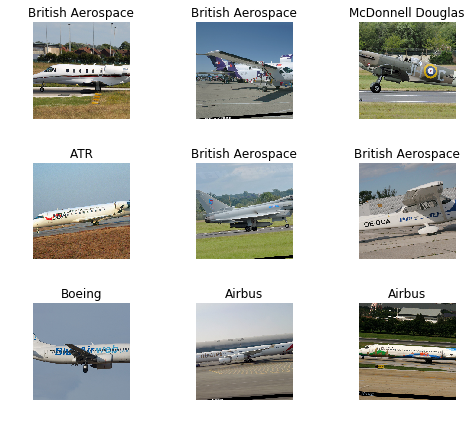

In [147]:
data.show_batch(rows=3, figsize=(7,6))

In [148]:
print(data.classes)
len(data.classes),data.c

['Boeing', 'Airbus', 'ATR', 'Antonov', 'British Aerospace', 'Beechcraft', 'Lockheed Corporation', 'Douglas Aircraft Company', 'Canadair', 'Cessna', 'McDonnell Douglas', 'de Havilland', 'Robin', 'Dornier', 'Embraer', 'Eurofighter', 'Lockheed Martin', 'Dassault Aviation', 'Fokker', 'Bombardier Aerospace', 'Gulfstream Aerospace', 'Ilyushin', 'Fairchild', 'Piper', 'Cirrus Aircraft', 'Saab', 'Supermarine', 'Panavia', 'Tupolev', 'Yakovlev']


(30, 30)

## Training: resnet34

Now we will start training our model. We will use a [convolutional neural network](http://cs231n.github.io/convolutional-networks/) backbone and a fully connected head with a single hidden layer as a classifier. Don't know what these things mean? Not to worry, we will dive deeper in the coming lessons. For the moment you need to know that we are building a model which will take images as input and will output the predicted probability for each of the categories (in this case, it will have 37 outputs).

We will train for 4 epochs (4 cycles through all our data).

In [149]:
learn = create_cnn(data, models.resnet34, metrics=error_rate)

In [150]:
learn.fit_one_cycle(4)

Total time: 03:58
epoch  train_loss  valid_loss  error_rate
1      3.321410    2.323764    0.602401    (00:59)
2      2.689360    2.043753    0.594899    (00:58)
3      2.371085    2.091979    0.623406    (00:59)
4      2.199212    2.071878    0.614404    (01:00)



In [151]:
learn.save('Aircraft-stage-1')

## Results

Let's see what results we have got. 

We will first see which were the categories that the model most confused with one another. We will try to see if what the model predicted was reasonable or not. In this case the mistakes look reasonable (none of the mistakes seems obviously naive). This is an indicator that our classifier is working correctly. 

Furthermore, when we plot the confusion matrix, we can see that the distribution is heavily skewed: the model makes the same mistakes over and over again but it rarely confuses other categories. This suggests that it just finds it difficult to distinguish some specific categories between each other; this is normal behaviour.

In [152]:
interp = ClassificationInterpretation.from_learner(learn)

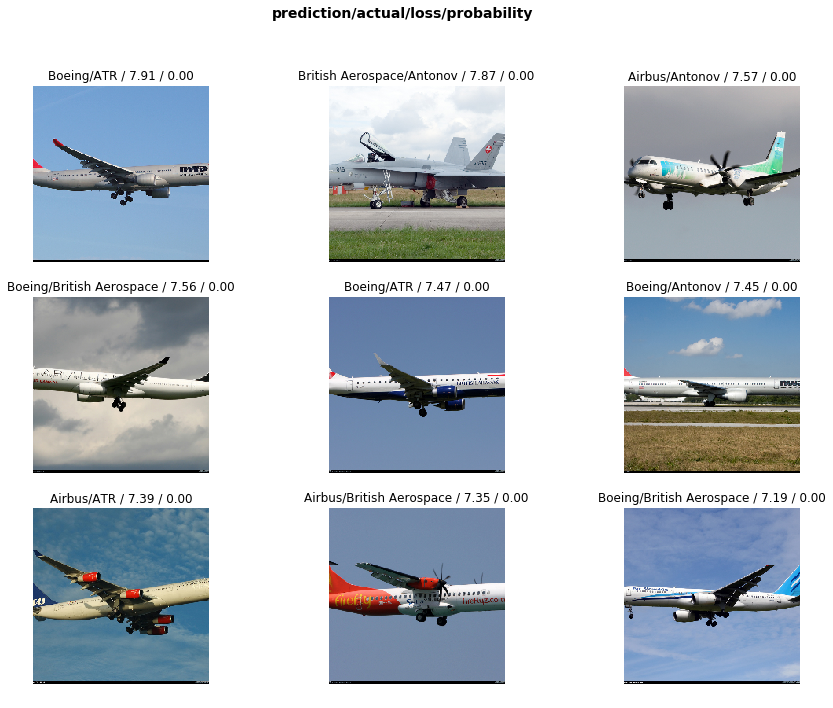

In [153]:
interp.plot_top_losses(9, figsize=(15,11))

In [154]:
doc(interp.plot_top_losses)

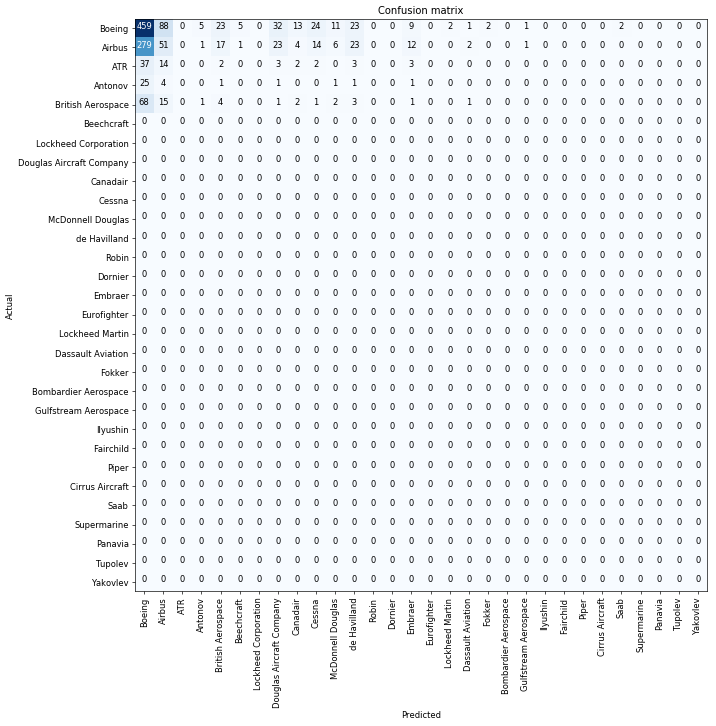

In [155]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [156]:
interp.most_confused(min_val=2)

[('Airbus', 'Boeing', 279),
 ('Boeing', 'Airbus', 88),
 ('British Aerospace', 'Boeing', 68),
 ('ATR', 'Boeing', 37),
 ('Boeing', 'Douglas Aircraft Company', 32),
 ('Antonov', 'Boeing', 25),
 ('Boeing', 'Cessna', 24),
 ('Boeing', 'British Aerospace', 23),
 ('Boeing', 'de Havilland', 23),
 ('Airbus', 'Douglas Aircraft Company', 23),
 ('Airbus', 'de Havilland', 23),
 ('Airbus', 'British Aerospace', 17),
 ('British Aerospace', 'Airbus', 15),
 ('Airbus', 'Cessna', 14),
 ('ATR', 'Airbus', 14),
 ('Boeing', 'Canadair', 13),
 ('Airbus', 'Embraer', 12),
 ('Boeing', 'McDonnell Douglas', 11),
 ('Boeing', 'Embraer', 9),
 ('Airbus', 'McDonnell Douglas', 6),
 ('Boeing', 'Antonov', 5),
 ('Boeing', 'Beechcraft', 5),
 ('Airbus', 'Canadair', 4),
 ('Antonov', 'Airbus', 4),
 ('ATR', 'Douglas Aircraft Company', 3),
 ('ATR', 'de Havilland', 3),
 ('ATR', 'Embraer', 3),
 ('British Aerospace', 'de Havilland', 3)]

## Unfreezing, fine-tuning, and learning rates

Since our model is working as we expect it to, we will *unfreeze* our model and train some more.

In [157]:
learn.unfreeze()

In [158]:
learn.fit_one_cycle(1)

Total time: 01:00
epoch  train_loss  valid_loss  error_rate
1      2.423467    2.117326    0.617404    (01:00)



In [160]:
learn.load('Aircraft-stage-1')

Learner(data=ImageDataBunch;
Train: LabelList
y: CategoryList (6667 items)
['Boeing' 'Boeing' 'Boeing' 'Boeing' ... 'Yakovlev' 'Yakovlev' 'Yakovlev' 'Yakovlev']
Path: .
x: ImageItemList (5334 items)
[PosixPath('fgvc-aircraft-2013b/data/images/1340192.jpg') PosixPath('fgvc-aircraft-2013b/data/images/0056978.jpg')
 PosixPath('fgvc-aircraft-2013b/data/images/0698580.jpg') PosixPath('fgvc-aircraft-2013b/data/images/0450014.jpg') ...
 PosixPath('fgvc-aircraft-2013b/data/images/0944182.jpg') PosixPath('fgvc-aircraft-2013b/data/images/1340345.jpg')
 PosixPath('fgvc-aircraft-2013b/data/images/0765754.jpg') PosixPath('fgvc-aircraft-2013b/data/images/1594714.jpg')]
Path: fgvc-aircraft-2013b/data/images;
Valid: LabelList
y: CategoryList (6667 items)
['Boeing' 'Boeing' 'Boeing' 'Boeing' ... 'Yakovlev' 'Yakovlev' 'Yakovlev' 'Yakovlev']
Path: .
x: ImageItemList (1333 items)
[PosixPath('fgvc-aircraft-2013b/data/images/1363952.jpg') PosixPath('fgvc-aircraft-2013b/data/images/1455394.jpg')
 PosixPath('

In [161]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


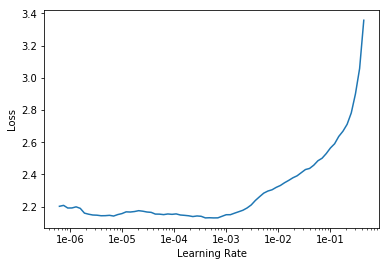

In [162]:
learn.recorder.plot()

In [163]:
learn.unfreeze()
learn.fit_one_cycle(4, max_lr=slice(1e-5,1e-3))

Total time: 04:02
epoch  train_loss  valid_loss  error_rate
1      2.110425    2.153100    0.637659    (00:59)
2      2.006970    2.471119    0.689422    (01:00)
3      1.789375    2.468006    0.684171    (01:00)
4      1.600475    2.515644    0.681170    (01:01)



That's a pretty accurate model!

## Training: resnet50

Now we will train in the same way as before but with one caveat: instead of using resnet34 as our backbone we will use resnet50 (resnet34 is a 34 layer residual network while resnet50 has 50 layers. It will be explained later in the course and you can learn the details in the [resnet paper](https://arxiv.org/pdf/1512.03385.pdf)).

Basically, resnet50 usually performs better because it is a deeper network with more parameters. Let's see if we can achieve a higher performance here. To help it along, let's us use larger images too, since that way the network can see more detail. We reduce the batch size a bit since otherwise this larger network will require more GPU memory.

In [0]:
# data = ImageDataBunch.from_name_re(path_img, fnames, pat, ds_tfms=get_transforms(),
#                                    size=299, bs=bs//2).normalize(imagenet_stats)

In [164]:
data = ImageDataBunch.from_lists(path_img, f_names, labels, ds_tfms=get_transforms(), size=299, bs=bs//2).normalize(imagenet_stats)

In [165]:
learn = create_cnn(data, models.resnet50, metrics=error_rate)

In [166]:
learn.fit_one_cycle(8)

Total time: 13:58
epoch  train_loss  valid_loss  error_rate
1      3.060624    2.613889    0.666917    (01:53)
2      2.494973    2.270506    0.650413    (01:43)
3      2.236093    2.372946    0.660165    (01:43)
4      2.072856    2.438790    0.687922    (01:43)
5      1.871909    2.504348    0.679670    (01:43)
6      1.722700    2.568763    0.695424    (01:43)
7      1.554078    2.584027    0.678920    (01:43)
8      1.472825    2.627637    0.692423    (01:43)



In [167]:
learn.save('Aircraft-stage-1-50')

It's astonishing that it's possible to recognize pet breeds so accurately! Let's see if full fine-tuning helps:

In [168]:
learn.unfreeze()
learn.fit_one_cycle(3, max_lr=slice(1e-6,1e-4))

epoch,train_loss,valid_loss,error_rate


RuntimeError: CUDA error: out of memory

If it doesn't, you can always go back to your previous model.

In [0]:
learn.load('stage-1-50')

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

In [0]:
interp.most_confused(min_val=2)

[('Ragdoll', 'Birman', 7),
 ('american_pit_bull_terrier', 'staffordshire_bull_terrier', 6),
 ('Egyptian_Mau', 'Bengal', 6),
 ('Maine_Coon', 'Bengal', 3),
 ('staffordshire_bull_terrier', 'american_pit_bull_terrier', 3)]

## Other data formats

In [0]:
path = untar_data(URLs.MNIST_SAMPLE); path

PosixPath('/home/jhoward/.fastai/data/mnist_sample')

In [0]:
tfms = get_transforms(do_flip=False)
data = ImageDataBunch.from_folder(path, ds_tfms=tfms, size=26)

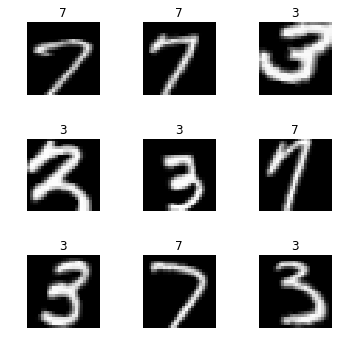

In [0]:
data.show_batch(rows=3, figsize=(5,5))

In [0]:
learn = create_cnn(data, models.resnet18, metrics=accuracy)
learn.fit(2)

Total time: 00:11
epoch  train loss  valid loss  accuracy
1      0.108823    0.025363    0.991168  (00:05)
2      0.061547    0.020443    0.994112  (00:05)



In [0]:
df = pd.read_csv(path/'labels.csv')
df.head()

,name,label
0,train/3/7463.png,0
1,train/3/21102.png,0
2,train/3/31559.png,0
3,train/3/46882.png,0
4,train/3/26209.png,0


In [0]:
data = ImageDataBunch.from_csv(path, ds_tfms=tfms, size=28)

[0, 1]

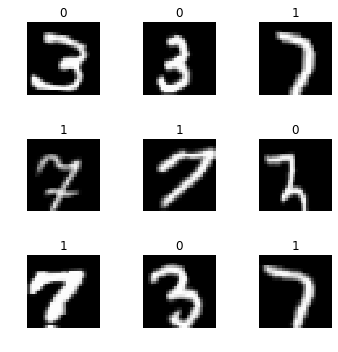

In [0]:
data.show_batch(rows=3, figsize=(5,5))
data.classes

In [0]:
data = ImageDataBunch.from_df(path, df, ds_tfms=tfms, size=24)
data.classes

[0, 1]

In [0]:
fn_paths = [path/name for name in df['name']]; fn_paths[:2]

[PosixPath('/home/jhoward/.fastai/data/mnist_sample/train/3/7463.png'),
 PosixPath('/home/jhoward/.fastai/data/mnist_sample/train/3/21102.png')]

In [0]:
pat = r"/(\d)/\d+\.png$"
data = ImageDataBunch.from_name_re(path, fn_paths, pat=pat, ds_tfms=tfms, size=24)
data.classes

['3', '7']

In [0]:
data = ImageDataBunch.from_name_func(path, fn_paths, ds_tfms=tfms, size=24,
        label_func = lambda x: '3' if '/3/' in str(x) else '7')
data.classes

['3', '7']

In [0]:
labels = [('3' if '/3/' in str(x) else '7') for x in fn_paths]
labels[:5]

['3', '3', '3', '3', '3']

In [0]:
data = ImageDataBunch.from_lists(path, fn_paths, labels=labels, ds_tfms=tfms, size=24)
data.classes

['3', '7']

In [169]:
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
 process = psutil.Process(os.getpid())
 print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
 print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))
printm()

  Running setup.py bdist_wheel for gputil ... done
  Stored in directory: /home/jupyter/.cache/pip/wheels/17/0f/04/b79c006972335e35472c0b835ed52bfc0815258d409f560108
Successfully built gputil
thinc 6.12.0 requires msgpack<1.0.0,>=0.5.6, which is not installed.
msgpack-numpy 0.4.3.2 requires msgpack>=0.3.0, which is not installed.
fastai 1.0.24 requires torchvision-nightly, which is not installed.
distributed 1.21.8 requires msgpack, which is not installed.
spacy 2.0.16 has requirement numpy>=1.15.0, but you'll have numpy 1.14.3 which is incompatible.
spacy 2.0.16 has requirement regex==2018.01.10, but you'll have regex 2018.8.29 which is incompatible.
jupyter-console 5.2.0 has requirement prompt_toolkit<2.0.0,>=1.0.0, but you'll have prompt-toolkit 2.0.6 which is incompatible.
You are using pip version 10.0.1, however version 18.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
thinc 6.12.0 requires msgpack<1.0.0,>=0.5.6, which is not installed.